# Exploratory Data Analysis with Visual Analysis of the data
The data is mainly divided into **Training** & **Testing** sets on which EDA and VA has been performed. All the first graph/chart under each heading starts with traing dataset followed by the testing dataset. All the descriptions regarding the graph/chart will be given below.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
init_notebook_mode(connected=True)  
import cufflinks as cf  
cf.go_offline() 
from plotly.offline import iplot
import plotly.graph_objs as go
import plotly.figure_factory as ff
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import linkage,dendrogram
train = pd.read_csv('/home/aryan/Documents/Jupyter Notebook/data/C and PCA/training.csv')
test = pd.read_csv('/home/aryan/Documents/Jupyter Notebook/data/C and PCA/testing.csv')

# Checking Training Dataset

In [2]:
train.head()

,class,max_ndvi,20150720_N,20150602_N,20150517_N,20150501_N,20150415_N,20150330_N,20150314_N,20150226_N,...,20140610_N,20140525_N,20140509_N,20140423_N,20140407_N,20140322_N,20140218_N,20140202_N,20140117_N,20140101_N
0,water,997.904,637.5950,658.668,-1882.030,-1924.36,997.904,-1739.990,630.087,-1628.240,...,-921.193,-1043.160,-1942.490,267.138,366.608,452.238,211.328,-2203.02,-1180.190,433.906
1,water,914.198,634.2400,593.705,-1625.790,-1672.32,914.198,-692.386,707.626,-1670.590,...,-954.719,-933.934,-625.385,120.059,364.858,476.972,220.878,-2250.00,-1360.560,524.075
2,water,3800.810,1671.3400,1206.880,449.735,1071.21,546.371,1077.840,214.564,849.599,...,1562.210,1566.160,2208.440,1056.600,385.203,300.560,293.730,2762.57,150.931,3800.810
3,water,952.178,58.0174,-1599.160,210.714,-1052.63,578.807,-1564.630,-858.390,729.790,...,-1025.880,368.622,-1786.950,-1227.800,304.621,291.336,369.214,-2202.12,600.359,-1343.550
4,water,1232.120,72.5180,-1220.880,380.436,-1256.93,515.805,-1413.180,-802.942,683.254,...,-1813.950,155.624,-1189.710,-924.073,432.150,282.833,298.320,-2197.36,626.379,-826.727


In [3]:
test.head()

,class,max_ndvi,20150720_N,20150602_N,20150517_N,20150501_N,20150415_N,20150330_N,20150314_N,20150226_N,...,20140610_N,20140525_N,20140509_N,20140423_N,20140407_N,20140322_N,20140218_N,20140202_N,20140117_N,20140101_N
0,water,2750.11,1361.89,-247.508,-521.17300,-1123.910,2653.08,-264.4140,-456.4660,2080.85,...,2380.00,1078.400,1778.030,2673.610,-178.9710,2238.580,1000.760,-81.5418,1146.260,-1566.490
1,water,2646.25,1760.85,481.100,6.26571,398.950,2646.25,550.9820,92.6923,2188.03,...,2009.69,1083.700,2029.520,1033.900,-19.6148,2183.660,927.882,668.7500,1519.740,-568.973
2,water,3509.62,3509.62,-241.320,-1239.32000,-330.388,1257.19,-175.1710,-294.5000,-1315.06,...,1838.51,1538.750,846.783,965.654,-468.0240,-222.312,1124.250,1132.9000,594.059,-993.658
3,water,2820.47,2138.69,-126.186,-522.28100,-741.163,2334.70,-207.4360,-76.9686,2820.47,...,2098.55,984.456,2239.330,593.874,1540.8800,2398.420,846.470,572.3080,1311.610,-1396.500
4,water,2684.13,1995.80,-1029.570,1713.62000,-472.258,2526.99,-91.7429,-146.2260,2487.71,...,2684.13,1432.150,2174.890,1321.690,1351.5800,2381.950,870.890,1174.3300,991.427,-185.322


# Box Plot

In [4]:
train.iplot(kind='box')

**Graph Description:** Above box plot is for the Training set considering all the Numerical Columns

In [5]:
test.iplot(kind='box')

**Graph Description:** Above box plot is for the Testing set considering all the Numerical Columns

In [6]:
train['class'].iplot(kind='box')

**Graph Description:** Box plot for all the classes in the training set

In [7]:
test['class'].iplot(kind='box')

**Graph Description:** Box plot for all the classes in the testing set

# Pie chart

In [8]:
fig=go.Pie(labels=train['class'].value_counts().index.tolist(),values=list(pd.value_counts(train['class'])))
iplot([fig])

**Graph Description:**  Class distribution for Training set

In [9]:
fig=go.Pie(labels=test['class'].value_counts().index.tolist(),values=list(pd.value_counts(test['class'])))
iplot([fig])

**Graph Description:** Class distribution for Testing set

# Histogram

In [10]:
train['class'].iplot(kind='hist')

**Graph Description:** For Training set

In [11]:
test['class'].iplot(kind='hist')

**Graph Description:** For Testing set

In [12]:
df = pd.concat([train,test])

In [13]:
df.head()

,class,max_ndvi,20150720_N,20150602_N,20150517_N,20150501_N,20150415_N,20150330_N,20150314_N,20150226_N,...,20140610_N,20140525_N,20140509_N,20140423_N,20140407_N,20140322_N,20140218_N,20140202_N,20140117_N,20140101_N
0,water,997.904,637.5950,658.668,-1882.030,-1924.36,997.904,-1739.990,630.087,-1628.240,...,-921.193,-1043.160,-1942.490,267.138,366.608,452.238,211.328,-2203.02,-1180.190,433.906
1,water,914.198,634.2400,593.705,-1625.790,-1672.32,914.198,-692.386,707.626,-1670.590,...,-954.719,-933.934,-625.385,120.059,364.858,476.972,220.878,-2250.00,-1360.560,524.075
2,water,3800.810,1671.3400,1206.880,449.735,1071.21,546.371,1077.840,214.564,849.599,...,1562.210,1566.160,2208.440,1056.600,385.203,300.560,293.730,2762.57,150.931,3800.810
3,water,952.178,58.0174,-1599.160,210.714,-1052.63,578.807,-1564.630,-858.390,729.790,...,-1025.880,368.622,-1786.950,-1227.800,304.621,291.336,369.214,-2202.12,600.359,-1343.550
4,water,1232.120,72.5180,-1220.880,380.436,-1256.93,515.805,-1413.180,-802.942,683.254,...,-1813.950,155.624,-1189.710,-924.073,432.150,282.833,298.320,-2197.36,626.379,-826.727


In [14]:
len(df)

10845

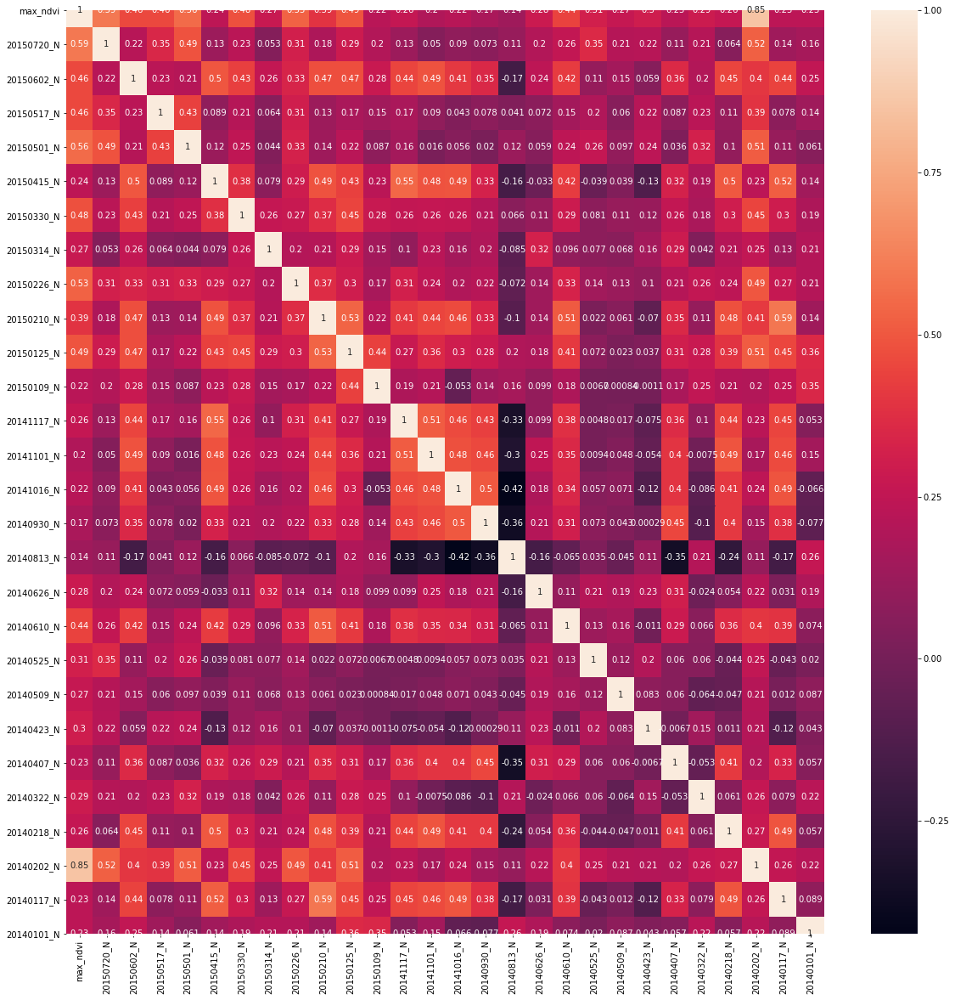

In [15]:
fig, ax = plt.subplots(figsize=(20, 20)) 
sns.heatmap(df.corr(), annot = True, ax = ax)

# Clustering
For the purpose of clustering we took Clustermap and dendrogram as ways to achieve clustering.
Firstly we need to Transpose the entire dataset and make the columns as indexes.

In [16]:
Data = df.copy()
Data = Data.drop(['class'],axis=1)
Data = Data.transpose()

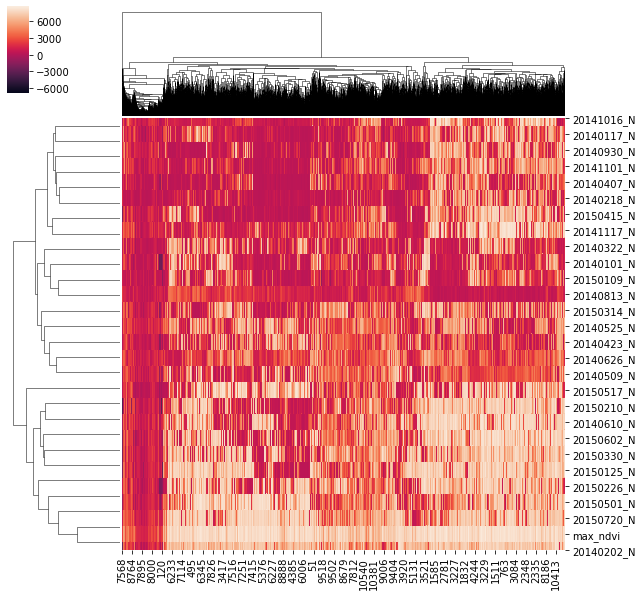

In [17]:
sns.clustermap(Data)

**Graph Description:** Clustermap for the combines dataset

In [18]:
fig = ff.create_dendrogram(Data, orientation='left', labels=list(Data.index),linkagefun=lambda x: linkage(Data, 'ward', metric='euclidean'))
fig.show()

**Graph Description:** Dendrogram of the entire dataset. Let's draw a line from 0.46M to unveil the clsuters

Below is speacial function designed to draw the line over the dendrogram and also to unveil the dendrogram nodes around the line.

In [19]:
def fd(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('Cluster Size')
        plt.ylabel('Distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

{'icoord': [[5.0, 5.0, 15.0, 15.0],
  [35.0, 35.0, 45.0, 45.0],
  [25.0, 25.0, 40.0, 40.0],
  [10.0, 10.0, 32.5, 32.5],
  [75.0, 75.0, 85.0, 85.0],
  [65.0, 65.0, 80.0, 80.0],
  [55.0, 55.0, 72.5, 72.5],
  [95.0, 95.0, 105.0, 105.0],
  [63.75, 63.75, 100.0, 100.0],
  [21.25, 21.25, 81.875, 81.875],
  [115.0, 115.0, 125.0, 125.0],
  [145.0, 145.0, 155.0, 155.0],
  [135.0, 135.0, 150.0, 150.0],
  [175.0, 175.0, 185.0, 185.0],
  [165.0, 165.0, 180.0, 180.0],
  [142.5, 142.5, 172.5, 172.5],
  [120.0, 120.0, 157.5, 157.5],
  [215.0, 215.0, 225.0, 225.0],
  [205.0, 205.0, 220.0, 220.0],
  [195.0, 195.0, 212.5, 212.5],
  [265.0, 265.0, 275.0, 275.0],
  [255.0, 255.0, 270.0, 270.0],
  [245.0, 245.0, 262.5, 262.5],
  [235.0, 235.0, 253.75, 253.75],
  [203.75, 203.75, 244.375, 244.375],
  [138.75, 138.75, 224.0625, 224.0625],
  [51.5625, 51.5625, 181.40625, 181.40625]],
 'dcoord': [[0.0, 292624.4746065526, 292624.4746065526, 0.0],
  [0.0, 296849.0681991098, 296849.0681991098, 0.0],
  [0.0, 29801

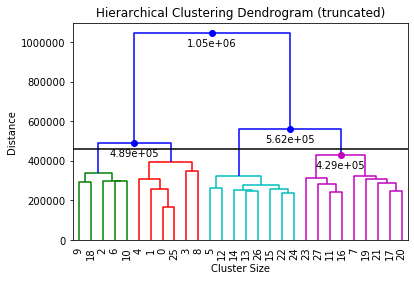

In [20]:
Z = linkage(Data,method='ward')
fd(Z,leaf_rotation=90.,show_contracted=True,annotate_above=400000,max_d=460000)

**Graph Description:** So the line drawn at 0.46M gives us 4 clusters in total.

# Classification
Let's begin the process of classification which will involve many classifiers. Classifiers involved are:-

1. Decision Tree
2. Random Forest
3. Extreme Gradient Boosting
4. Multilayer Perceptron
5. Support Vector Machine

The performance of models are measured through confusion matrix and classification report. 

In [21]:
classes = df['class'].value_counts().index.tolist()
classes

['forest', 'farm', 'impervious', 'grass', 'water', 'orchard']

So in total there are 6 Subclasses in total

In [22]:
from sklearn.preprocessing import LabelEncoder,scale
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split as t
import sklearn.metrics as mt

Before we begin classifying the subclass labels need to be encoded because the models only accepts integer values

In [23]:
le = LabelEncoder()
Y = df['class']
y = le.fit_transform(Y)

Train and Test splitting is done with 80:20 ratio

In [24]:
X = df.select_dtypes('float64')
x = scale(X)
train_x,test_x,train_y,test_y = t(x,y,test_size=0.2)

In [25]:
classifiers = [
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    XGBClassifier(),
    MLPClassifier(hidden_layer_sizes=(100,50,6),max_iter=500),    #6 Subclasses
    SVC(kernel='linear')
    ]

/home/aryan/Anaconda/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



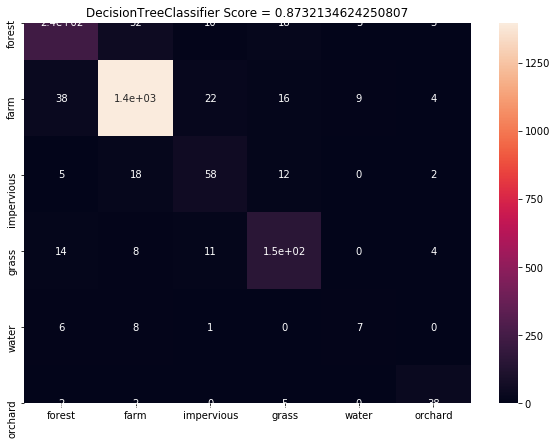

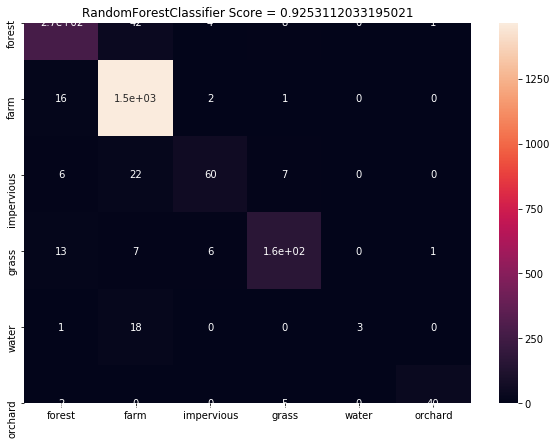

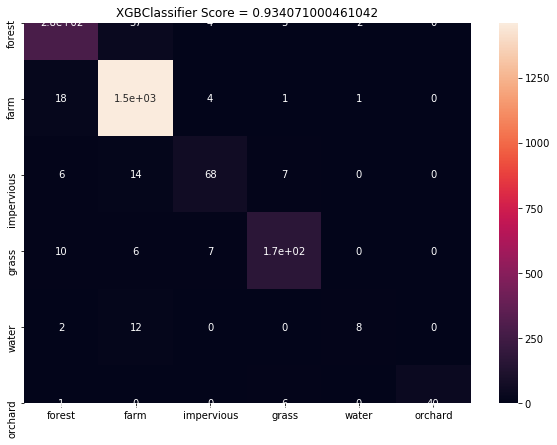

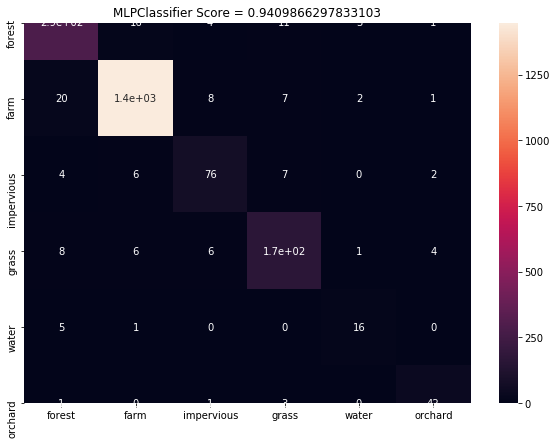

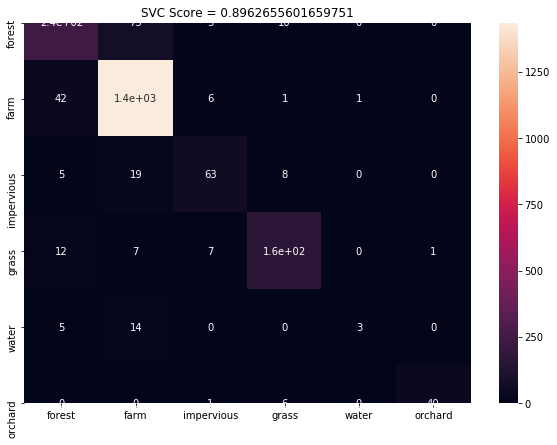

In [26]:
for c in classifiers:
    c.fit(train_x,train_y)
    df_cm = pd.DataFrame(mt.confusion_matrix(test_y,c.predict(test_x)),classes,classes)
    plt.figure(figsize = (10,7))
    plt.title(f'{c.__class__.__name__} Score = {c.score(test_x,test_y)}')
    if c==SVC(kernel='linear'):
        print(f'{c.__class__.__name__} Score = {mt.r2_score(test_y,c.predict(test_x))}')
    sns.heatmap(df_cm, annot=True)

In [27]:
for c in classifiers:
    print('='*20+' '+c.__class__.__name__+' '+'='*20)
    print(mt.classification_report(test_y,c.predict(test_x)))
    print('\n')

==================== DecisionTreeClassifier ====================
              precision    recall  f1-score   support

           0       0.79      0.73      0.76       328
           1       0.94      0.94      0.94      1486
           2       0.57      0.61      0.59        95
           3       0.75      0.81      0.78       191
           4       0.33      0.32      0.33        22
           5       0.75      0.81      0.78        47

    accuracy                           0.87      2169
   macro avg       0.69      0.70      0.69      2169
weighted avg       0.87      0.87      0.87      2169



==================== RandomForestClassifier ====================
              precision    recall  f1-score   support

           0       0.88      0.83      0.85       328
           1       0.94      0.99      0.96      1486
           2       0.83      0.63      0.72        95
           3       0.89      0.86      0.87       191
           4       1.00      0.14      0.24        22
